Fitting 5 folds for each of 108 candidates, totalling 540 fits
Fitting 5 folds for each of 108 candidates, totalling 540 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5268
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Number of data points in the train set: 1219, number of used features: 28
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5261
[LightGBM] [Info] Total Bins 5259
[LightGBM] [Info] Start training from score -53.702215
[LightGBM] [Info] Number of data points in the train set: 1219, number of used features: 28
[LightGBM] [Info] Number of data points in the 

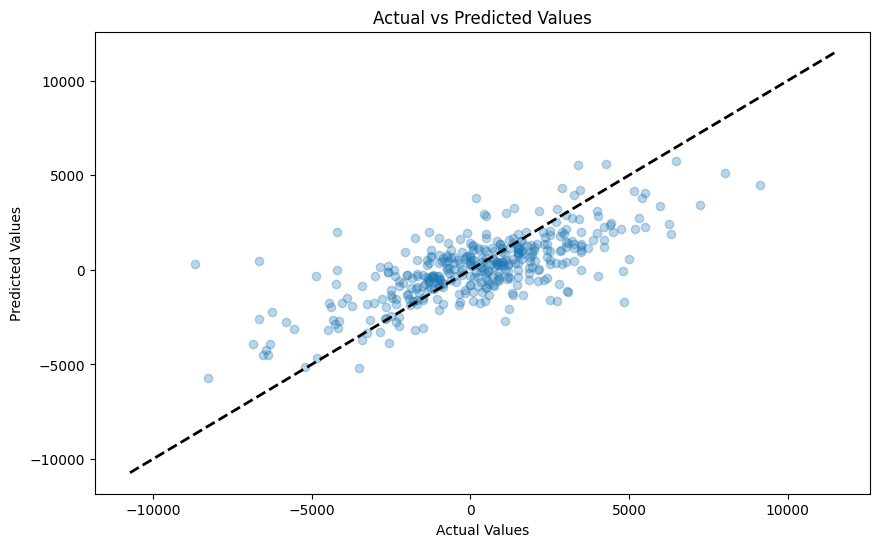

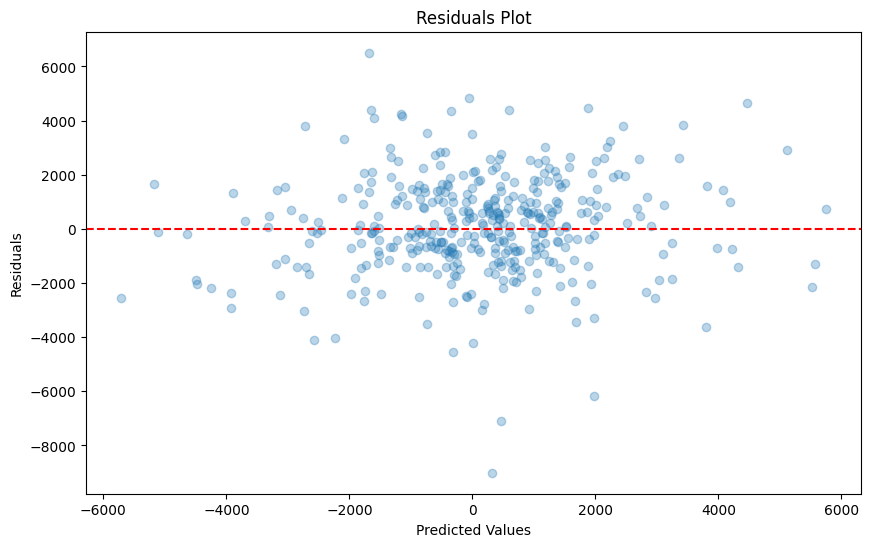

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1168
[LightGBM] [Info] Number of data points in the train set: 152, number of used features: 28
[LightGBM] [Info] Start training from score -77.940789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/opt/homebrew/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1770
[LightGBM] [Info] Number of data points in the train set: 243, number of used features: 28
[LightGBM] [Info] Start training from score 186.650206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

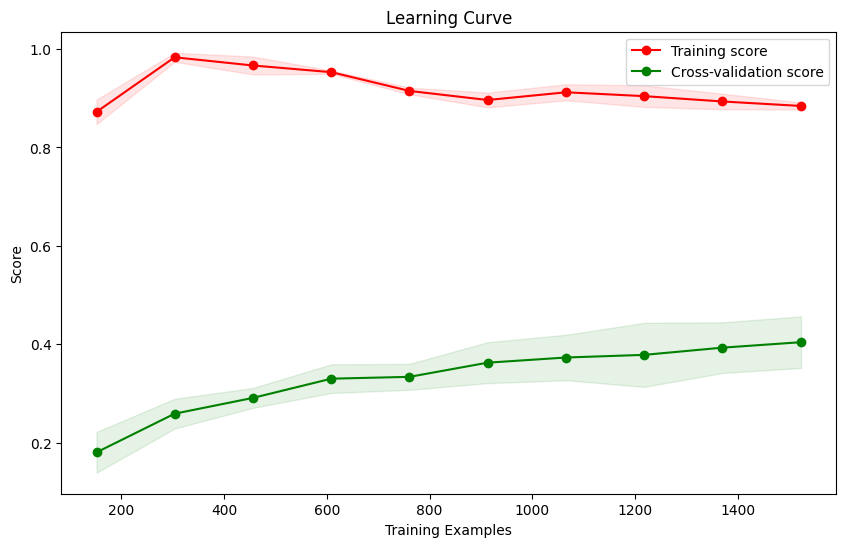

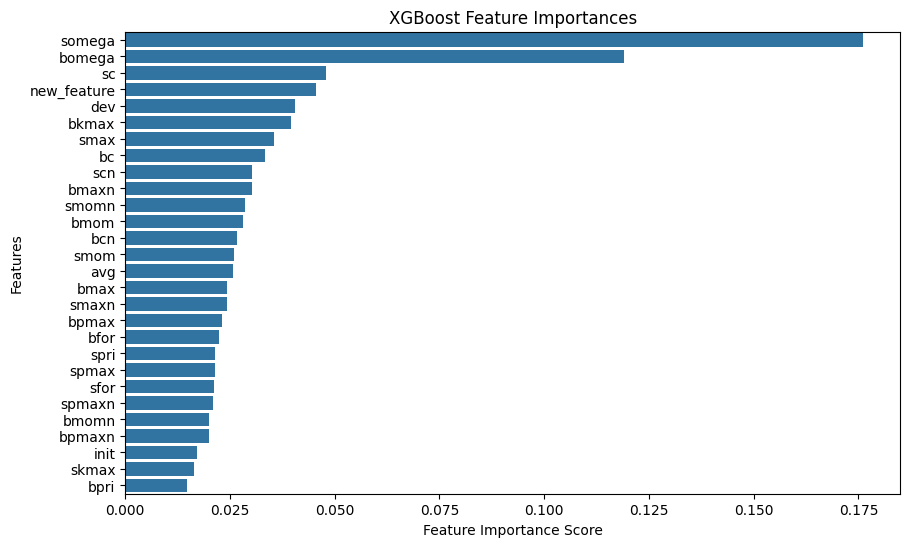

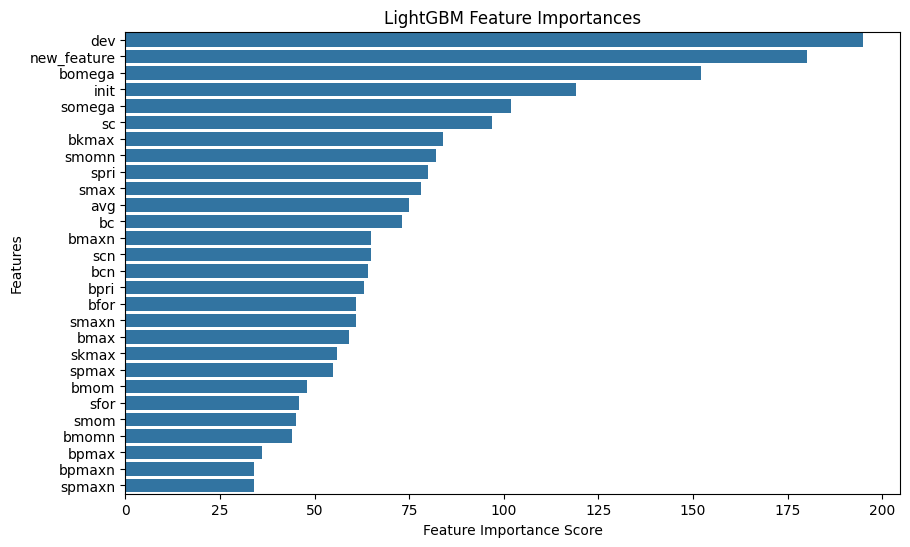

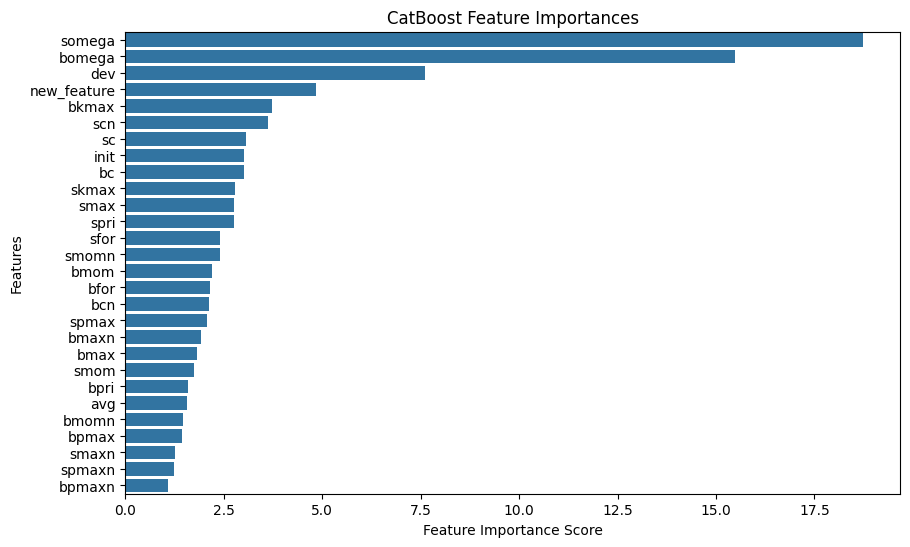

In [5]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, learning_curve
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import StackingRegressor
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# 데이터 로드 및 전처리
data = pd.read_csv('data/bsmax_0_1.csv', delimiter='\t')
data = data.dropna()  # 결측값 제거
data = data[(np.abs(stats.zscore(data)) < 3).all(axis=1)]  # 이상값 제거

# 특성 공학 (중요한 특성 조합 및 추가 특성 생성)
data['new_feature'] = data['avg'] * data['dev']

data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 개별 모델 정의 및 하이퍼파라미터 튜닝
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

param_grid_lgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

param_grid_cat = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [3, 5, 7],
    'subsample': [0.8, 1.0]
}

xgb = XGBRegressor(random_state=42)
grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_xgb.fit(X_train, y_train)
best_xgb_model = grid_search_xgb.best_estimator_

lgb = LGBMRegressor(random_state=42)
grid_search_lgb = GridSearchCV(estimator=lgb, param_grid=param_grid_lgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_lgb.fit(X_train, y_train)
best_lgb_model = grid_search_lgb.best_estimator_

cat = CatBoostRegressor(random_state=42, verbose=0)
grid_search_cat = GridSearchCV(estimator=cat, param_grid=param_grid_cat, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_cat.fit(X_train, y_train)
best_cat_model = grid_search_cat.best_estimator_

# Stacking Ensemble 모델 정의
stacking_model = StackingRegressor(
    estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)],
    final_estimator=LinearRegression()
)

# 모델 학습
stacking_model.fit(X_train, y_train)

# 예측
y_pred_stacking = stacking_model.predict(X_test)

# 모델 평가
mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble Test R² Score: {r2_stacking}')

# 교차 검증을 통한 모델 성능 평가
cv_scores = cross_val_score(stacking_model, X_scaled, y, cv=5, scoring='r2')
print(f'Cross-Validated R² Scores: {cv_scores}')
print(f'Average Cross-Validated R² Score: {np.mean(cv_scores)}')

# 시각화 1: 실제 값과 예측 값의 분포 비교
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_stacking, alpha=0.3)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
plt.show()

# 시각화 2: 잔차 분석 (Residuals Plot)
residuals = y_test - y_pred_stacking
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_stacking, residuals, alpha=0.3)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# 시각화 3: 학습 곡선 (Learning Curve)
train_sizes, train_scores, test_scores = learning_curve(stacking_model, X_scaled, y, cv=5, scoring='r2', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color='r')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color='g')
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# 시각화 4: 각 개별 모델의 특성 중요도 (Feature Importances)
def plot_feature_importances(model, model_name):
    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
        features = data_processed.columns
        feature_importances = pd.Series(importances, index=features).sort_values(ascending=False)

        plt.figure(figsize=(10, 6))
        sns.barplot(x=feature_importances, y=feature_importances.index)
        plt.xlabel('Feature Importance Score')
        plt.ylabel('Features')
        plt.title(f'{model_name} Feature Importances')
        plt.show()
    else:
        print(f"The model {model_name} does not have feature_importances_ attribute.")

plot_feature_importances(best_xgb_model, 'XGBoost')
plot_feature_importances(best_lgb_model, 'LightGBM')
plot_feature_importances(best_cat_model, 'CatBoost')
